In [2]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pickle
from torch.utils.data import Subset

manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)

### Hyperparameters

In [2]:
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
LEARNING_RATE = 0.0002
BATCH_SIZE = 64
IMAGE_SIZE = 64
IMAGE_CHANNELS = 3
NUM_CLASSES = 10
EMBED_SIZE = 100
Z_DIM = 100
EPOCHS = 50
DISC_FEATURES = 64
GEN_FEATURES = 64

### Download Images for Training

In [3]:
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])
trainset = Dataset.CIFAR10('./data', download=True, train=True, transform=transform)
test = Dataset.CIFAR10('./data', download=True, train=False, 
                           transform=transform)
#Merge train and test images
trainset=trainset+test

trainloader = torch.utils.data.DataLoader(trainset, shuffle=True, batch_size=BATCH_SIZE)


Files already downloaded and verified
Files already downloaded and verified


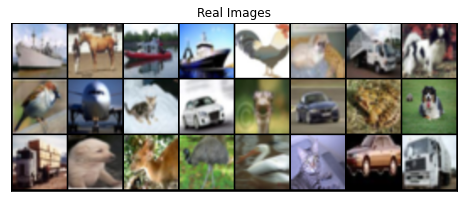

In [4]:
def imshow(imgs, title, figsize=(8,8), nrow=8):
    imgs = vutils.make_grid(imgs, nrow, normalize=True)
    imgs=imgs.numpy()
    plt.figure(figsize=figsize)
    plt.imshow(np.transpose(imgs, (1,2,0)))
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.show()
    
images, labels = next(iter(trainloader))
imshow(images[:24], 'Real Images')

### Generator and Discriminator Models

In [5]:
class Generator(nn.Module):
    def __init__(self, num_classes, img_size, embed_size):
        super(Generator, self).__init__()
        self.img_size = img_size
        self.net = nn.Sequential(
            nn.ConvTranspose2d(Z_DIM+embed_size, GEN_FEATURES*16, 4, 1, 0, bias=False), # 1024 x 4 x 4
            self._block(GEN_FEATURES*16, GEN_FEATURES*8, 4, 2, 1),           # 512 x 8 x 8
            self._block(GEN_FEATURES*8, GEN_FEATURES*4, 4, 2, 1),            # 256 x 16 x 16
            self._block(GEN_FEATURES*4, GEN_FEATURES*2, 4, 2, 1),            # 128 x 32 x 32
            nn.ConvTranspose2d(GEN_FEATURES*2, IMAGE_CHANNELS, 4, 2, 1),     # 64 x 64 x 64  #size. (n_channels) x 64 x 64
            nn.Tanh() )
        
        self.embed = nn.Embedding(num_classes, embed_size)
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.ConvTranspose2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.ReLU() )
    
    def forward(self, z, labels):
        #z (latent vector) = batch_size x noise_dim x 1 x 1
        embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
        z = torch.cat([z, embedding], dim=1) #batch_size x C x img_size(H) x img_size(W)
        return self.net(z)


In [6]:
class Discriminator(nn.Module):
    def __init__(self, num_classes, img_size):
        super(Discriminator, self).__init__()
        self.img_size = img_size
        self.net = nn.Sequential(
            # input size: batch_size x 3 x 64 x 64
            nn.Conv2d(IMAGE_CHANNELS, DISC_FEATURES, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),                          # 64 x 32 x 32
            self._block(DISC_FEATURES, DISC_FEATURES*2, 4, 2, 1),     # 128 x 16 x 16
            self._block(DISC_FEATURES*2, DISC_FEATURES*4, 4, 2, 1),   # 256 x 8 x 8
            self._block(DISC_FEATURES*4, DISC_FEATURES*8, 4, 2, 1),   # 512 x 4 x 4
            #nn.Conv2d(DISC_FEATURES*8, 1, 4, 2, 0, bias=False),       # 1 x 1 x 1
            #nn.Sigmoid()
        )
        
        self.embed = nn.Embedding(num_classes, img_size*img_size)
        
        #input 512*4*4
        self.validity_layer = nn.Sequential(
            nn.Conv2d(512,1,4,1,0,bias = False),
                                   nn.Sigmoid())
        
        self.labels = nn.Sequential(
            nn.Conv2d(512, 11, 4, 1, 0, bias = False), 
            nn.LogSoftmax(dim = 1)
        )
        
        
    def _block(self, in_channels, out_channels, kernel, stride, padding):
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel, stride, padding, bias=False),
                             nn.BatchNorm2d(out_channels),
                             nn.LeakyReLU(0.2),
                            )
    
    def forward(self, x):
        x= self.net(x)
        validity = self.validity_layer(x).view(-1)
        label = self.labels(x).view(-1, 11)
        return validity, label

In [7]:
def gradientPenalty(critic, labels, real, fake):
    batch_size, C, H, W = real.shape
    eps = torch.rand(batch_size, 1, 1, 1).repeat(1, C, H, W).to(device)
    interpolation = real*eps + fake*(1-eps)
    
    #compute critic scores
    mixed_scores = critic(interpolation, labels)
    
    gradient = torch.autograd.grad(inputs=interpolation,
                                  outputs=mixed_scores,
                                  grad_outputs=torch.ones_like(mixed_scores),
                                  create_graph=True,
                                  retain_graph=True)[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [8]:
def weight_initialization(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)
            
            
DiscModel =Discriminator(NUM_CLASSES, IMAGE_SIZE).to(device)
GenModel = Generator(NUM_CLASSES, IMAGE_SIZE, EMBED_SIZE).to(device)

#initialize weights for both models
DiscModel.apply(weight_initialization)
GenModel.apply(weight_initialization)

#LOSS FUNCTION
criterion = nn.BCELoss()

disc_optim = optim.Adam(DiscModel.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
gen_optim = optim.Adam(GenModel.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))

### Training

[10/50]   Loss_D:0.6602150797843933   Loss_G:4.92795467376709


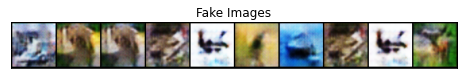

[20/50]   Loss_D:0.5272784233093262   Loss_G:12.380457878112793


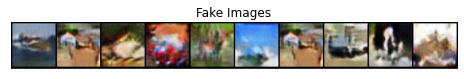

[30/50]   Loss_D:0.499231219291687   Loss_G:4.56230354309082


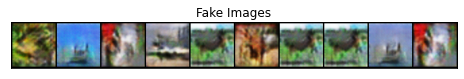

[40/50]   Loss_D:0.12961433827877045   Loss_G:27.61910057067871


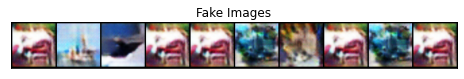

[50/50]   Loss_D:0.34642648696899414   Loss_G:14.35152816772461


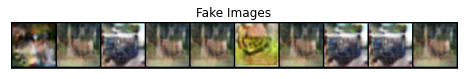

In [9]:
img_list = []
GEN_LOSS = []
DISC_LOSS = []
FID_score = []

for epoch in range(1,EPOCHS+1):
    DiscModel.train()
    GenModel.train()
    for i, (images, labels) in enumerate(trainloader):
        images = images.to(device)
        img_labels = labels.to(device)
              
        mb_size = images.size(0)
        fake_class_labels = 10*torch.ones((mb_size,),dtype = torch.long,device = device)
        #--------------------------------------------------- 
        #TRAIN DISCRIMINATOR
        #---------------------------------------------------       
        disc_optim.zero_grad()    

        #train critic with real images
        val_label = torch.full((mb_size,), 1.0, dtype=torch.float).to(device)
        disc_real, disc_label = DiscModel(images)
        discRealVal_Loss = criterion(disc_real, val_label) 
        discRealLabel_Loss = F.nll_loss(disc_label, img_labels)
        discReal_Loss = discRealVal_Loss + discRealLabel_Loss
        discReal_Loss.backward()

        #train discriminator with fake images
        samplelabels = torch.randint(0, 10, (mb_size,), dtype = torch.long, device = device)
        noise = torch.randn(mb_size, Z_DIM, 1, 1).to(device)
        fake = GenModel(noise, samplelabels)
        disc_fake,  disc_label= DiscModel(fake.detach())
        val_label.fill_(0.0)
        discfakeVal_Loss = criterion(disc_fake, val_label) 
        discFakelLabel_Loss = F.nll_loss(disc_label, fake_class_labels)
        discFake_Loss = discfakeVal_Loss + discFakelLabel_Loss
        discFake_Loss.backward()
        #compute average discriminator loss
        disc_Loss = (discReal_Loss + discFake_Loss) / 2
        #update discriminator parameters
        #disc_Loss.backward()
        disc_optim.step()
            
        
        #--------------------------------- 
        # TRAIN GENERATOR
        #--------------------------------- 
        gen_optim.zero_grad()
        noise = torch.randn(mb_size, Z_DIM, 1, 1).to(device)
        sample_labels = torch.randint(0,10,(mb_size,),device = device, dtype = torch.long)
        val_label.fill_(1.0)
        fake = GenModel(noise, sample_labels)
        output, output_label = DiscModel(fake)
        #calculate gen's loss
        genVal_Loss = criterion(output, val_label) 
        genLabel_Loss = F.nll_loss(output_label, sample_labels)
        gen_Loss = genVal_Loss + genLabel_Loss
        gen_Loss.backward()
        #update generator parameters
        gen_optim.step()
        
        #if i%100 == 0:
        #save both losses for plot
        GEN_LOSS.append(gen_Loss.item())
        DISC_LOSS.append(disc_Loss.item())
        
    #print(f'[{epoch}/{EPOCHS}]   Loss_D:{disc_Loss.item()}   Loss_G:{gen_Loss.item()}')
    with torch.no_grad():
        GenModel.eval()
        gen_images = GenModel(noise, sample_labels).detach()
    img_list.append(vutils.make_grid(gen_images, padding=2, normalize=True))
    
    vutils.save_image(images.cpu(),'Images/acganimages/real/image{}.png'.format(epoch), nrow=10, normalize=True)
    vutils.save_image(gen_images.cpu(),'Images/acganimages/fake/image{}.png'.format(epoch), nrow=10, normalize=True)
    
    #compute fid score
    #fid_score = compute_fidScore(images, gen_images)
    #FID_score.append(fid_score)
    
    if epoch%10 == 0:
        print(f'[{epoch}/{EPOCHS}]   Loss_D:{disc_Loss.item()}   Loss_G:{gen_Loss.item()}') #, FID_Score:{fid_score:.2f}')
        imshow(gen_images[:10].cpu(), 'Fake Images', figsize=(8,8), nrow=10)

        
#save image
vutils.save_image(gen_images[:10].cpu(),'Images/acganimage10.png', nrow=10)
vutils.save_image(gen_images[:24].cpu(),'Images/acganimage.png')
vutils.save_image(gen_images[:10].cpu(),'Images/acganimage10norm.png', nrow=10, normalize=True)
vutils.save_image(gen_images[:24].cpu(),'Images/acganimagenorm.png', normalize=True)
#save entire model
torch.save(GenModel,'Models/acgan.pth')  

#save losses to file
losses = {'GenLoss': GEN_LOSS,
         'DiscLoss': DISC_LOSS}
with open('pickle/acgan_loss.txt', 'wb') as f:
    pickle.dump(losses,f)

#save the generated images for visualization
with open('pickle/acganImg.txt', 'wb') as f:
    pickle.dump(img_list,f)

### Plot Loss

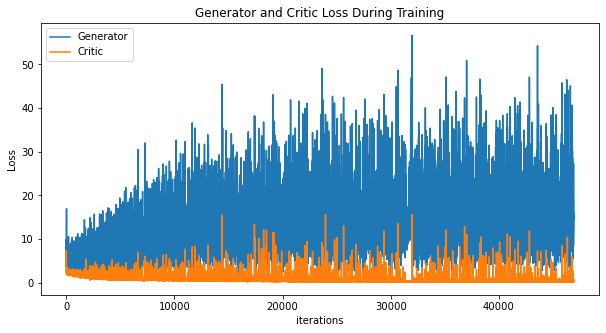

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Critic Loss During Training")
plt.plot(GEN_LOSS,label="Generator")
plt.plot(DISC_LOSS,label="Critic")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Compute FID Scores

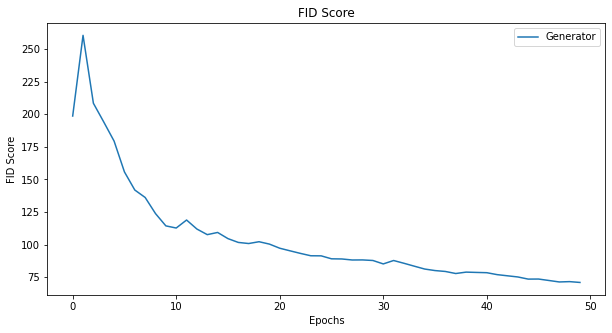

In [3]:
from FID import fidScore
acgan_FID = []
for i in range(50):
    i = i+1
    fids = fidScore('Images/acganimages/real', 'Images/acganimages/fake',i,64)
    print(f'Epoch:{i} and FID Score: {fids}', end = '\r', flush=True)
    acgan_FID.append(fids)
    
#save fid score list to file
with open('pickle/acganfid.txt', 'wb') as f:
    pickle.dump(acgan_FID,f)
    
plt.figure(figsize=(10,5))
plt.title("FID Score")
plt.plot(acgan_FID,label="Generator")
plt.xlabel("Epochs")
plt.ylabel("FID Score")
plt.legend()
plt.show()

### Visualize animation of images generated at every epoch

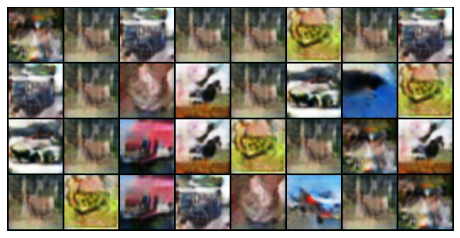

In [5]:
#%%capture
with open('pickle/acganImg.txt', 'rb') as f:
    image_list = pickle.load(f)

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in image_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())